In [1]:
import os
import numpy as np
import re
import pickle
import sys
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import datetime 
from mpl_toolkits.axes_grid1 import make_axes_locatable
import json
from statsmodels.graphics.mosaicplot import mosaic
from scipy.stats import gaussian_kde, linregress
from scipy import stats
import matplotlib.patches as mpatches
from matplotlib.colors import Normalize

from matplotlib.gridspec import GridSpec
# from matplotlib import gridspec
from matplotlib.ticker import FuncFormatter, MaxNLocator, FixedFormatter
import numpy as np
import matplotlib.pyplot as plt



# sys.path.insert(1, '../')
from MasterPlot_Functions import *
from FormatEvents_Functions import *

import cmasher as cmr
import matplotlib as mpl

# Access rainforest colormap through CMasher or MPL
cmap = cmr.rainforest                   
cmap = mpl.colormaps['cmr.seaweed']  

In [2]:
home_dir = '/nfs/a319/gy17m2a/PhD/'
home_dir2 = '/nfs/a161/gy17m2a/PhD/'

In [3]:
# tbo_vals = pd.read_csv(home_dir + 'datadir/RainGauge/interarrival_thresholds_CDD_noMissing.txt')
# tbo_vals = tbo_vals[tbo_vals['Lon']!=-999.0]
# tbo_vals['gauge_num'] = tbo_vals.index

### Load and prepare data

#### All events data

In [4]:
df_long = pd.read_csv(home_dir + f"ProcessedData/AMAX_Events/UKCP18_30mins/all_events_characteristics.csv")

present_all_events=df_long[df_long['Climate']=='Present'].copy()
future_all_events =df_long[df_long['Climate']=='Future'].copy()

In [5]:
print(len(present_all_events))
print(len(future_all_events))

1034950
1020443


#### Change data

In [6]:
df_changes_all = pd.read_csv(home_dir + f"ProcessedData/AMAX_Events/UKCP18_30mins/grouped_by_gauge_changes_allevents.csv")
df_changes_bydurationcat = pd.read_csv(home_dir + f"ProcessedData/AMAX_Events/UKCP18_30mins/grouped_by_gauge_changes_bydurcategory.csv")

# Storm characteristics

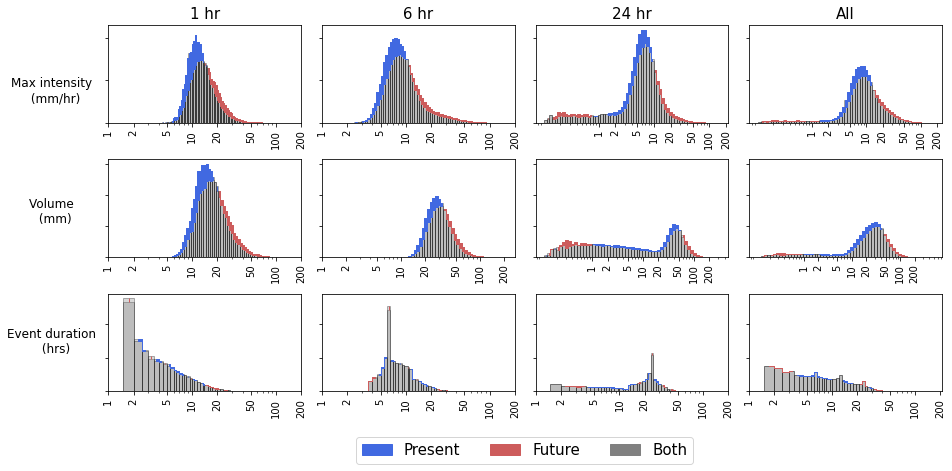

In [7]:
bin_edges_intensity = np.arange(0, 70 + 5, 2)
bin_edges_volume = np.arange(0, 135 + 5, 3)
bin_edges_duration = np.arange(0, 165 + 5,1)

durations = ['1', '6', '24']
alpha = 1
# Create a figure with subplots for different durations
n_categories = len(durations)
n_variables = 3
fig, axs = plt.subplots(n_categories, n_variables+1, figsize=(12, 2 * n_categories),  sharey='row')  

# Call the function for each variable in each duration category
for i, duration in enumerate(durations):
    plot_histogram_with_shaded_difference(present_data=present_all_events, future_data=future_all_events, variable='max_intensity', duration=duration,
    duration_variable="dur_for_which_this_is_amax", ax=axs[0,i], bins=70, alpha=alpha)
    
    plot_histogram_with_shaded_difference(present_data=present_all_events, future_data=future_all_events, variable='Volume', duration=duration,
    duration_variable="dur_for_which_this_is_amax", ax=axs[1,i], bins=60, alpha=alpha)   
    
    plot_histogram_with_shaded_difference(present_data=present_all_events, future_data=future_all_events, variable='duration', duration=duration,
    duration_variable="dur_for_which_this_is_amax", ax=axs[2,i], bins=60, alpha=alpha)       

    axs[0,0].set_title("1 hr", fontsize=15)
    axs[0,1].set_title("6 hr", fontsize=15)
    axs[0,2].set_title("24 hr", fontsize=15)
    axs[0,3].set_title("All", fontsize=15)
    
    # axs[0,3].legend(loc='upper right')

for ax in axs.flat:
    ax.set_yticklabels([])
    ax.set_ylabel("")

# Add the all data    
plot_histogram_with_shaded_difference_all(present_data=present_all_events, future_data=future_all_events, variable='max_intensity', 
    ax=axs[0,3], bins=70, alpha=alpha)       

plot_histogram_with_shaded_difference_all(present_data=present_all_events, future_data=future_all_events, variable='Volume', 
     ax=axs[1,3], bins=60, alpha=alpha)       

plot_histogram_with_shaded_difference_all(present_data=present_all_events, future_data=future_all_events, variable='duration', 
     ax=axs[2,3], bins=60, alpha=alpha)       

## Add legend
present_patch = mpatches.Patch(color='royalblue', label='Present')
future_patch = mpatches.Patch(color='indianred', label='Future')
both_patch = mpatches.Patch(color='grey', label='Both')
fig.legend(handles=[present_patch, future_patch, both_patch], loc = 'lower center', bbox_to_anchor=[0.5, -0.1],
           fontsize=15, ncol=4);

fig.text(-0.045, 0.78, 'Max intensity \n (mm/hr)', va='center', ha='center', fontsize=12, rotation='horizontal')
fig.text(-0.045, 0.50, 'Volume \n (mm)', va='center', ha='center', fontsize=12, rotation='horizontal')
fig.text(-0.045, 0.20, 'Event duration \n (hrs)', va='center', ha='center', fontsize=12, rotation='horizontal');

# Adjust layout to prevent overlap
plt.tight_layout()

# Seasonality of events
## Compare seasonal distribution for different durations AND between present and future

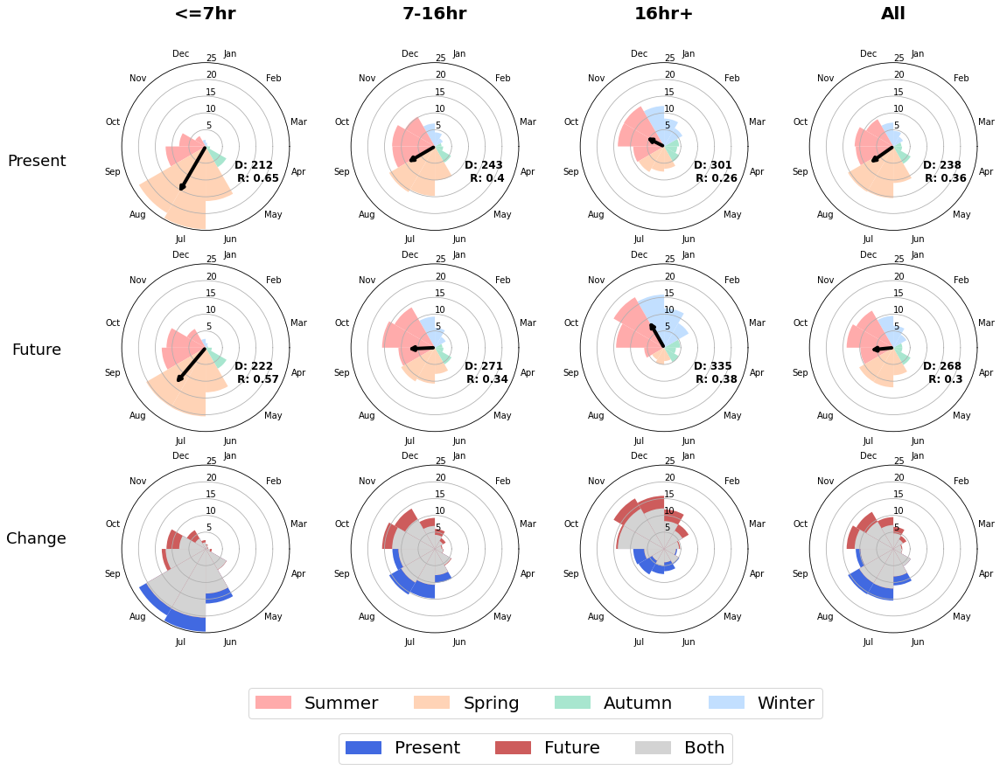

In [8]:
# List of durations and corresponding subplot titles
durations = ['<=7hr', '7-16hr', '16hr+']
titles = [f"{i}" for i in durations]

##########################################################
## present
##########################################################
fig, axes = plt.subplots(3, 4, figsize=(18, 12), subplot_kw={'polar': True})

# Loop through durations, axes, and titles
for ax_num, duration in enumerate(durations):
    this_duration = present_all_events[present_all_events["duration_category_onemore"] == duration]
    D_mean, R = calc_mean_day_and_dispersion(this_duration['theta'])
    plot_polar_months_plot(this_duration, axes[0, ax_num], True, duration, 25, 'Percentage', D_mean, R)
D_mean, R = calc_mean_day_and_dispersion(present_all_events['theta'])    
plot_polar_months_plot(present_all_events, axes[0, 3], True, "All",25, 'Percentage', D_mean, R)    
fig.text(0.06, 0.75, 'Present', va='center', ha='center', fontsize=18, rotation='horizontal');

##########################################################
## Future
##########################################################
for ax_num, duration in enumerate(durations):
    this_duration = future_all_events[future_all_events["duration_category_onemore"] == duration]
    D_mean, R = calc_mean_day_and_dispersion(this_duration['theta'])
    plot_polar_months_plot(this_duration, axes[1,ax_num], False, duration, 25, 'Percentage', D_mean, R)
D_mean, R = calc_mean_day_and_dispersion(future_all_events['theta'])    
plot_polar_months_plot(future_all_events, axes[1,3], False, "Present (all)",25,  'Percentage', D_mean, R)    
fig.text(0.06, 0.50, 'Future', va='center', ha='center', fontsize=18, rotation='horizontal');

# ##########################################################
# ## Present and future overlaid
# ##########################################################
for ax_num, duration in enumerate(durations):
    this_duration_pres = present_all_events[present_all_events["duration_category_onemore"] == duration]
    this_duration_future = future_all_events[future_all_events["duration_category_onemore"] == duration]
    plot_polar_months_plot_overlay(this_duration_pres, this_duration_future, axes[2, ax_num], False, 'All', False, 25) 
plot_polar_months_plot_overlay(present_all_events, future_all_events, axes[2, 3], False, 'All', False, 25) 
fig.text(0.06, 0.25, 'Change', va='center', ha='center', fontsize=18, rotation='horizontal');

## Create legend
winter_patch = mpatches.Patch(color='#C2DFFF', label='Winter')
autumn_patch = mpatches.Patch(color='#A8E6CF', label='Autumn')
spring_patch = mpatches.Patch(color='#FFD3B6', label='Spring')
summer_patch = mpatches.Patch(color='#FFABAB', label='Summer')

fig.legend(handles=[summer_patch, spring_patch, autumn_patch, winter_patch], loc = 'lower center', bbox_to_anchor=[0.5, 0],
           fontsize=20, ncol=4);

## Create legend
present_patch = mpatches.Patch(color='royalblue', label='Present')
future_patch = mpatches.Patch(color='indianred', label='Future')
both_patch = mpatches.Patch(color='lightgrey', label='Both')
fig.legend(handles=[present_patch, future_patch, both_patch], loc = 'lower center', bbox_to_anchor=[0.5, -0.06],
           fontsize=20, ncol=3);

## Day of year and R values 
For each gauge we can calculate:  
    - The mean day of year that events occur  
    - The R value of events - a measure of how dispersed/concentrated events are within a year  

### Day of year - present, future, change

In [9]:
D_diffs, D_diffs_dict = find_significance_of_differences(present_all_events, future_all_events, 'D')

In [10]:
D50_diffs, D50_diffs_dict =find_significance_of_differences(present_all_events, future_all_events, 'D50_new')

In [11]:
results_dict = {'All': {}, '<=7hr': {}, '7-16hr': {}, '16hr+': {}}

categories = [1, 2, 3, 4, 5]
durations = ['All', '<=7hr', '7-16hr', '16hr+']

# Initialize results_dict to hold category-specific results for each duration
for duration in durations:
    for category in categories:
        results_dict[duration][category] = []

for gauge_num in range(0, 1294):
    if gauge_num not in [444, 827, 888]:
        for duration in durations:
            # Filter data for the current gauge and duration
            if duration == 'All':
                gauge_p = present_all_events[present_all_events['gauge_num'] == gauge_num]
                gauge_f = future_all_events[future_all_events['gauge_num'] == gauge_num]
            else:
                gauge_p = present_all_events[
                    (present_all_events['gauge_num'] == gauge_num) &
                    (present_all_events['duration_category_onemore'] == duration)
                ]
                gauge_f = future_all_events[
                    (future_all_events['gauge_num'] == gauge_num) &
                    (future_all_events['duration_category_onemore'] == duration)
                ]

            # Run the proportion test
            proportion_test_results = test_proportions(gauge_p, gauge_f, categories, 'max_quintile_molly')

            # Extract the 'diff' column (1 if p_value < 0.05, 0 otherwise) for each category
            for category in categories:
                diff = (proportion_test_results[proportion_test_results['category'] == category]['p_value'] < 0.05).astype(int).values[0]
                results_dict[duration][category].append(diff)


In [12]:
diff_cmap = create_custom_colormap('RdBu')
diff_cmap = modify_colormap(diff_cmap)

cmap = create_custom_colormap('viridis')
cmap = modify_colormap(cmap)

reversed_cmap = reverse_colormap(cmap)

quintiles_cmap = create_custom_colormap('viridis')
quintiles_cmap = modify_colormap(quintiles_cmap)

/nfs/a319/gy17m2a/PhD/Scripts/FindIndependentRainfallEvents/AnalyseProfiles/AMAX_Events/MasterPlot_Functions.py:999: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.savefig("day_of_year_seasonal_durcats.jpg")


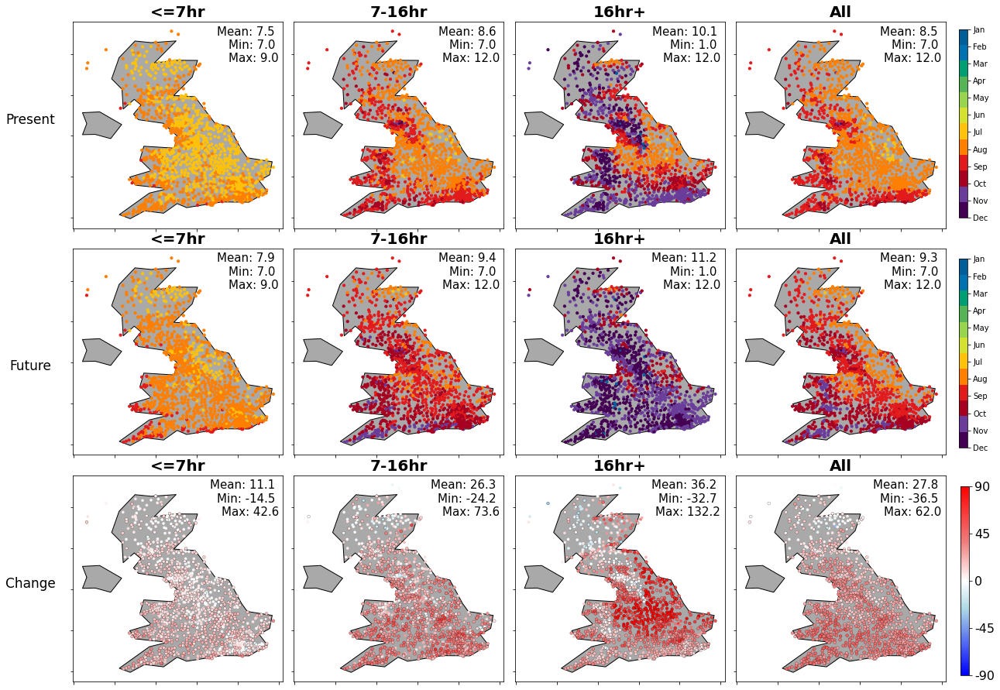

In [13]:
make_plot_D_seasonal_durcats(df_changes_all, df_changes_bydurationcat, 'D_mean', diff_cmap, D_diffs_dict )

###  R (how dispersed events are) - present, future change

/nfs/a321/gy17m2a/anaconda_install/anaconda3/envs/ukcp18/lib/python3.7/site-packages/ipykernel_launcher.py:79: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


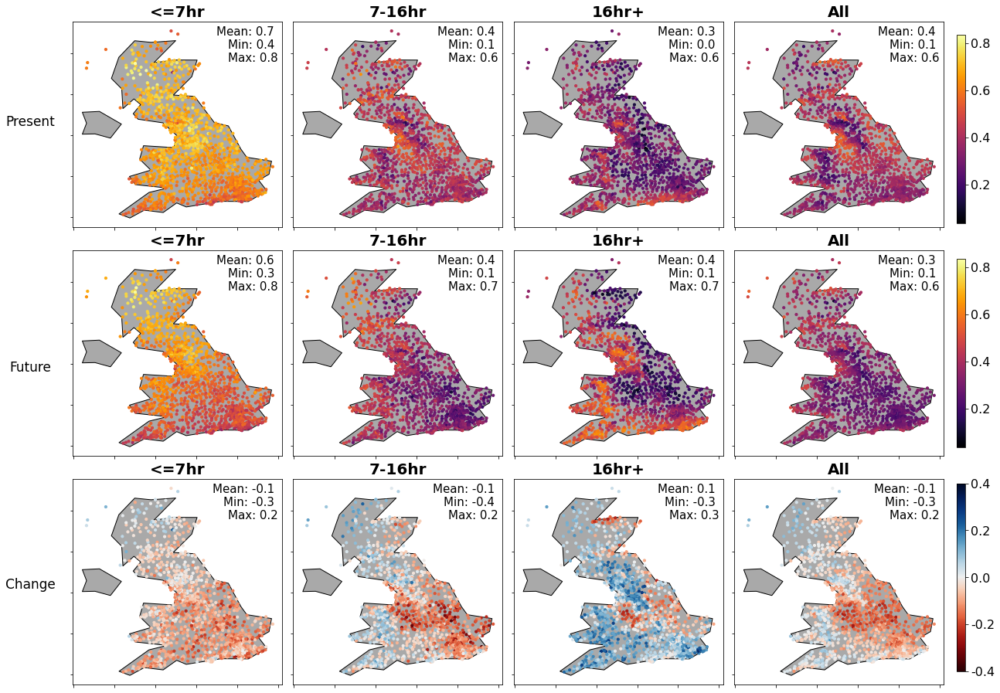

In [17]:
make_plot_durcats(df_changes_all, df_changes_bydurationcat, 'R', 'inferno', diff_cmap, D_diffs_dict, False, -0.4, 0.4)

## Distribution of values

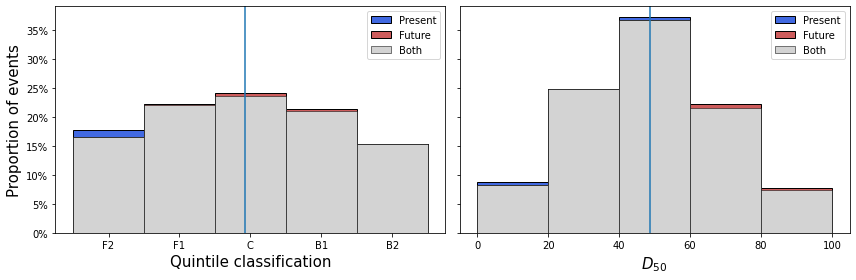

In [18]:
# Example usage with sample data
fig, axs = plt.subplots(ncols=2, figsize=(12, 4), sharey=True)

# Example bins
bins = 5

# Plot D50 histogram with overlap
plot_proportion_histogram_with_overlap(axs[1], present_all_events['D50_new'], future_all_events['D50_new'], bins=[0,20,40,60,80,100])
axs[1].set_xlabel("$D_{50}$", fontsize=15)
axs[0].set_ylabel('Proportion of events', fontsize=15)

# Repeat for max_quintile_molly
plot_proportion_histogram_with_overlap(axs[0], present_all_events['max_quintile_molly'], future_all_events['max_quintile_molly'], bins=bins)
axs[0].set_xlabel('Quintile classification', fontsize=15)

# Calculate bin edges and centers for x-tick positioning
counts, bin_edges = np.histogram(present_all_events['max_quintile_molly'], bins=5)
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
axs[0].set_xticks(bin_centers)
axs[0].set_xticklabels(['F2', 'F1', 'C', 'B1', 'B2'])

plt.tight_layout()
plt.show()

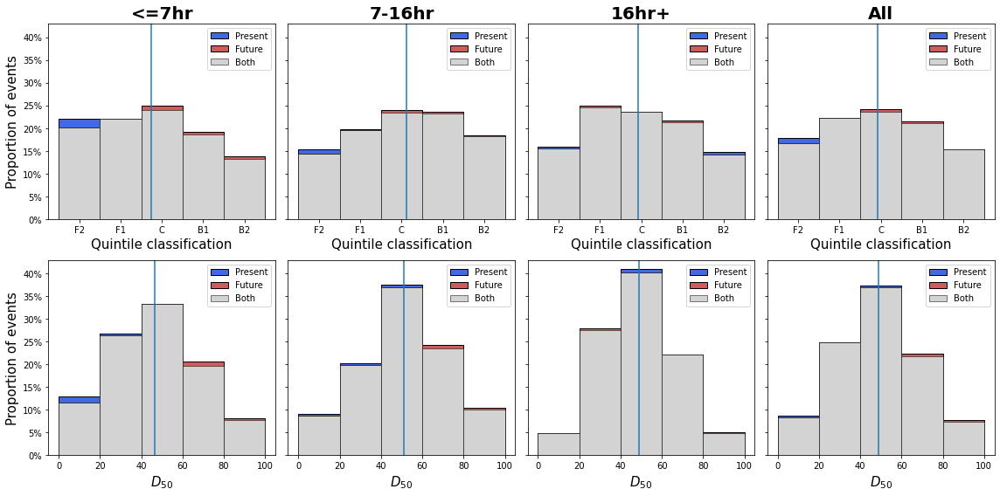

In [19]:
# Example usage with sample data
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16, 8), sharey=True, sharex='row')

# Example bins
bins = 5

for ax_num, duration in enumerate(['<=7hr', '7-16hr','16hr+', 'All']):    
    if duration =='All':
        this_duration_present = present_all_events
        this_duration_future = future_all_events
    else:
        this_duration_present = present_all_events[present_all_events["duration_category_onemore"] == duration]
        this_duration_future = future_all_events[future_all_events["duration_category_onemore"] == duration]

    # Plot D50 histogram with overlap
    plot_proportion_histogram_with_overlap(axs[1, ax_num], this_duration_present['D50_new'], this_duration_future['D50_new'], bins=[0,20,40,60,80,100])
    axs[1, ax_num].set_xlabel("$D_{50}$", fontsize=15)
    axs[0, ax_num].set_title(duration, fontsize=20, fontweight='bold')
    
    # Repeat for max_quintile_molly
    plot_proportion_histogram_with_overlap(axs[0, ax_num], this_duration_present['max_quintile_molly'], this_duration_future['max_quintile_molly'], bins=bins)
    axs[0,ax_num].set_xlabel('Quintile classification', fontsize=15)

    # Calculate bin edges and centers for x-tick positioning
    counts, bin_edges = np.histogram(this_duration_present['max_quintile_molly'], bins=5)
    bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
    axs[0,0].set_xticks(bin_centers)
    axs[0,0].set_xticklabels(['F2', 'F1', 'C', 'B1', 'B2'])

axs[0, 0].set_ylabel('Proportion of events', fontsize=15)
axs[1, 0].set_ylabel('Proportion of events', fontsize=15)
    
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x * 100:.0f}%'))    
plt.tight_layout()
plt.show()

## Line plots for D50

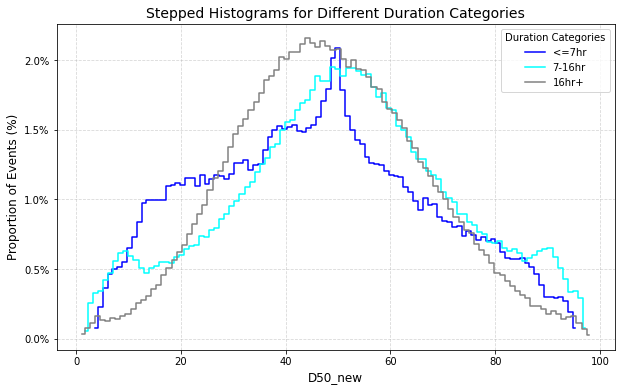

In [20]:
durations = ['<=7hr', '7-16hr', '16hr+']
colors = ['blue', 'cyan', 'gray', 'red']
plt.figure(figsize=(10, 6))  # Adjust figure size

# Loop through each duration category
for ax_num, (duration, color) in enumerate(zip(durations, colors)):
    # Filter the data for this duration
    this_duration_present = present_all_events[present_all_events["duration_category_onemore"] == duration]
    # Calculate the histogram (without plotting it yet) to get counts
    counts, bin_edges = np.histogram(this_duration_present['D50_new'], bins=100, density=False)
    
    # Normalize counts to proportions (as percentages)
    proportions = counts / counts.sum()
    
    # Plot the histogram as a stepped line
    plt.step(bin_edges[:-1], proportions * 100, where='mid',color=color, linewidth=1.5, label=duration)

# Add legend, labels, and grid
plt.xlabel('D50_new', fontsize=12)
plt.ylabel('Proportion of Events (%)', fontsize=12)  # Adjust y-axis label
plt.title('Stepped Histograms for Different Duration Categories', fontsize=14)
plt.legend(title='Duration Categories')
plt.grid(True, linestyle='--', alpha=0.5)

# Adjust y-axis to format percentages
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.1f}%'))

## D50 vs Day of year

In [21]:
# make_scatter_plot_durcats(df_changes_bydurationcat.copy(), '<=7hr', "future", loadings, axes, ax_row=5)
# make_scatter_plot_durcats(df_changes_bydurationcat.copy(), '7-16hr', "future", loadings, axes, ax_row=6)
# make_scatter_plot_durcats(df_changes_bydurationcat.copy(), '16hr+', "future", loadings, axes, ax_row=7)
# make_scatter_plot_durcats(df_changes_all.copy(), 'All', "future", loadings, axes, ax_row=8)
# fig.text(0.5, 0.5, 'Future', va='center', ha='center', fontsize=18, rotation='horizontal', fontweight='bold')

# fig.text(0.06, 0.435, '<=7 hr', va='center', ha='center', fontsize=15, rotation='horizontal', fontweight='bold')
# fig.text(0.06, 0.35, '7-16 hr', va='center', ha='center', fontsize=15, rotation='horizontal', fontweight='bold')
# fig.text(0.06, 0.25, '16+ hr', va='center', ha='center', fontsize=15, rotation='horizontal', fontweight='bold')
# fig.text(0.06, 0.17, 'All', va='center', ha='center', fontsize=15, rotation='horizontal', fontweight='bold')

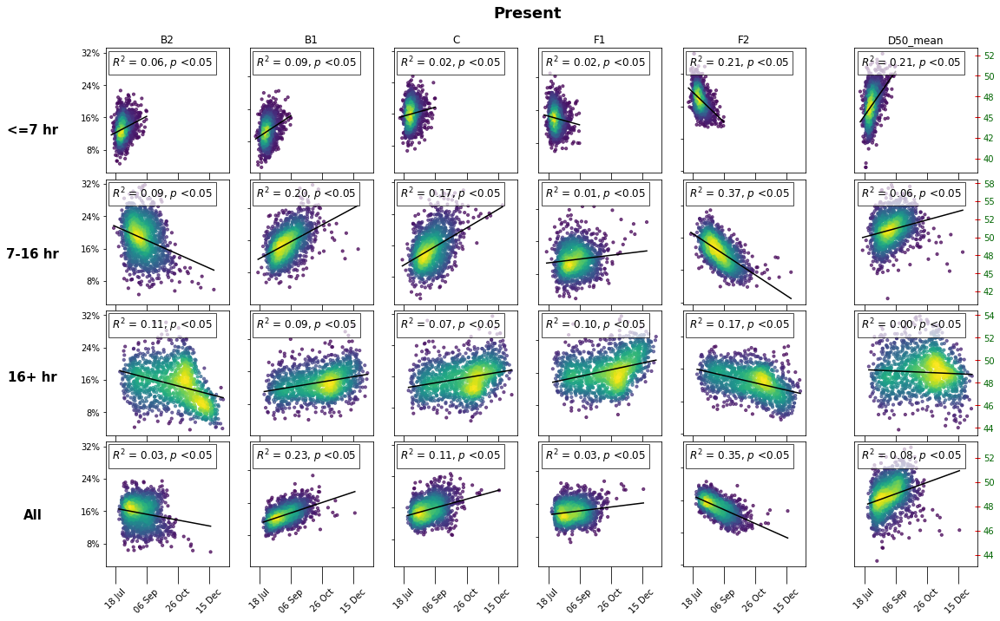

In [22]:
# Initialize the figure and axes with 7 columns (including a larger space between the second-to-last and last column)
fig, axes = plt.subplots(4, 7, figsize=(18, 11), sharex='all',
                         gridspec_kw={'hspace': 0.05, 'wspace': 0.2,
                                      'width_ratios': [1, 1, 1, 1, 1, 0.05, 1]})  # Adjusted for larger gap between last two columns

# Loop through each subplot
for i in range(7):  # Loop over all columns (now 7 columns)
    for j in range(4):  # Loop over rows
        ax = axes[j, i]
        
        # Skip the narrow column (index 5)
        if i == 5:  # This is the narrow column for spacing
            ax.set_visible(False)  # Hide this column
            continue
        
        if i < 5:  # For all columns except the last one
            ax.sharey(axes[0, i])
            ax.yaxis.set_major_formatter(PercentFormatter(xmax=100, decimals=0))  # Apply percentage format
            
            # Reduce the number of y-axis ticks
            ax.yaxis.set_major_locator(MaxNLocator(nbins=4))  # You can adjust 'nbins' to the desired number of ticks
            
            # Remove unnecessary tick labels
            if i > 0:  # Remove y-axis tick labels for shared columns except the first
                ax.tick_params(axis='y', labelleft=False)
        else:  # For the final column (unique y-axis)
            ax.yaxis.set_label_position('right')  # Move y-axis labels to the right
            ax.tick_params(axis='y', labelright=True, labelleft=False, colors='darkgreen', which='both')  # Red ticks
            ax.yaxis.set_major_formatter(FormatStrFormatter('%.0f'))  # Format with 0 decimal places
            ax.tick_params(axis='y', direction='inout', length=6, width=1, color='red', right=True)  # Add tick lines to the right side
            ax.tick_params(axis='y', left=False)  # Disable left-side ticks for the final column
        
        # Remove x-axis tick labels for all rows except the last
        if j < 3:
            ax.tick_params(axis='x', labelbottom=False)

# Example of adding a plot (just for demonstration)
loadings = ['B2_percentage', 'B1_percentage', 'C_percentage', 'F1_percentage', 'F2_percentage', 'D50_mean']
make_scatter_plot_durcats(df_changes_bydurationcat.copy(), '<=7hr', "present", loadings, axes, ax_row=0)
make_scatter_plot_durcats(df_changes_bydurationcat.copy(), '7-16hr', "present", loadings, axes, ax_row=1)
make_scatter_plot_durcats(df_changes_bydurationcat.copy(), '16hr+', "present", loadings, axes, ax_row=2)
make_scatter_plot_durcats(df_changes_all.copy(), 'All', "present", loadings, axes, ax_row=3)

fig.text(0.5, 0.93, 'Present', va='center', ha='center', fontsize=18, rotation='horizontal', fontweight='bold')
fig.text(0.06, 0.76, '<=7 hr', va='center', ha='center', fontsize=15, rotation='horizontal', fontweight='bold')
fig.text(0.06, 0.58, '7-16 hr', va='center', ha='center', fontsize=15, rotation='horizontal', fontweight='bold')
fig.text(0.06, 0.4, '16+ hr', va='center', ha='center', fontsize=15, rotation='horizontal', fontweight='bold')
fig.text(0.06, 0.2, 'All', va='center', ha='center', fontsize=15, rotation='horizontal', fontweight='bold')

# After plotting, convert Julian day ticks to calendar dates
for ax in axes.flatten():
    if ax is not None:  # In case of unused subplots
        # Get the current axis limits
        x_min, x_max = ax.get_xlim()
        
        # Restrict ticks to the visible range
        ticks = ax.get_xticks()
        visible_ticks = [tick for tick in ticks if x_min <= tick <= x_max]

        # Convert the visible ticks to date labels
        tick_labels = [julian_to_date(int(tick)) for tick in visible_ticks]
        # Apply the visible ticks and corresponding labels
        ax.set_xticks(visible_ticks)  # Restrict ticks to the visible range
        ax.xaxis.set_major_formatter(FixedFormatter(tick_labels))  # Set formatted labels
        ax.tick_params(axis='x', rotation=45, size=20)  # Rotate labels for better visibility

plt.show()

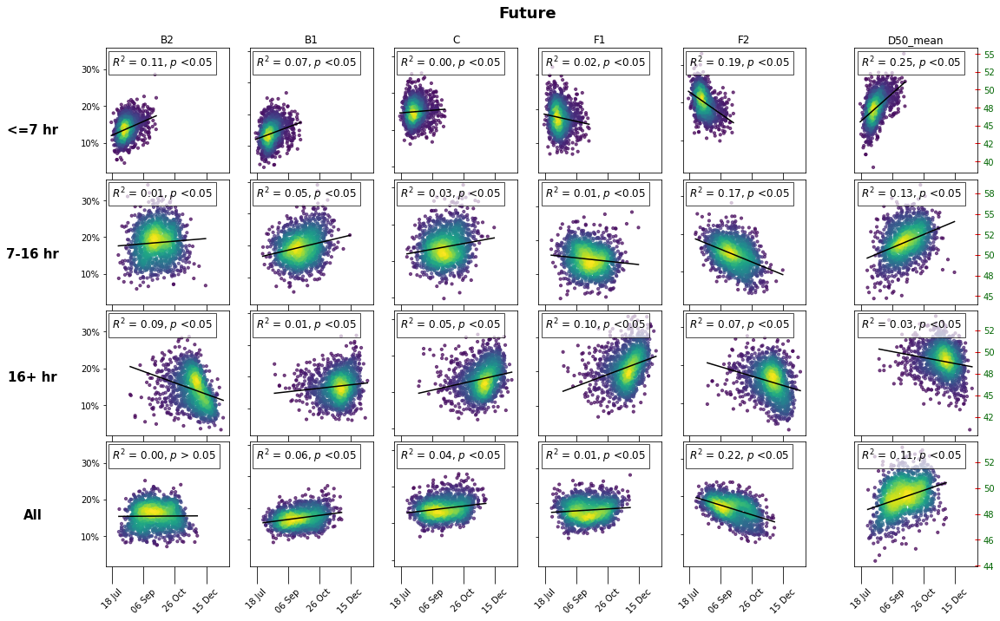

In [23]:
# Initialize the figure and axes with 7 columns (including a larger space between the second-to-last and last column)
fig, axes = plt.subplots(4, 7, figsize=(18, 11), sharex='all',
                         gridspec_kw={'hspace': 0.05, 'wspace': 0.2,
                                      'width_ratios': [1, 1, 1, 1, 1, 0.05, 1]})  # Adjusted for larger gap between last two columns

# Loop through each subplot
for i in range(7):  # Loop over all columns (now 7 columns)
    for j in range(4):  # Loop over rows
        ax = axes[j, i]
        
        # Skip the narrow column (index 5)
        if i == 5:  # This is the narrow column for spacing
            ax.set_visible(False)  # Hide this column
            continue
        
        if i < 5:  # For all columns except the last one
            ax.sharey(axes[0, i])
            ax.yaxis.set_major_formatter(PercentFormatter(xmax=100, decimals=0))  # Apply percentage format
            
            # Reduce the number of y-axis ticks
            ax.yaxis.set_major_locator(MaxNLocator(nbins=4))  # You can adjust 'nbins' to the desired number of ticks
            
            # Remove unnecessary tick labels
            if i > 0:  # Remove y-axis tick labels for shared columns except the first
                ax.tick_params(axis='y', labelleft=False)
        else:  # For the final column (unique y-axis)
            ax.yaxis.set_label_position('right')  # Move y-axis labels to the right
            ax.tick_params(axis='y', labelright=True, labelleft=False, colors='darkgreen', which='both')  # Red ticks
            ax.yaxis.set_major_formatter(FormatStrFormatter('%.0f'))  # Format with 0 decimal places
            ax.tick_params(axis='y', direction='inout', length=6, width=1, color='red', right=True)  # Add tick lines to the right side
            ax.tick_params(axis='y', left=False)  # Disable left-side ticks for the final column
        
        # Remove x-axis tick labels for all rows except the last
        if j < 3:
            ax.tick_params(axis='x', labelbottom=False)

# Example of adding a plot (just for demonstration)
loadings = ['B2_percentage', 'B1_percentage', 'C_percentage', 'F1_percentage', 'F2_percentage', 'D50_mean']
make_scatter_plot_durcats(df_changes_bydurationcat.copy(), '<=7hr', "future", loadings, axes, ax_row=0)
make_scatter_plot_durcats(df_changes_bydurationcat.copy(), '7-16hr', "future", loadings, axes, ax_row=1)
make_scatter_plot_durcats(df_changes_bydurationcat.copy(), '16hr+', "future", loadings, axes, ax_row=2)
make_scatter_plot_durcats(df_changes_all.copy(), 'All', "future", loadings, axes, ax_row=3)

fig.text(0.5, 0.93, 'Future', va='center', ha='center', fontsize=18, rotation='horizontal', fontweight='bold')
fig.text(0.06, 0.76, '<=7 hr', va='center', ha='center', fontsize=15, rotation='horizontal', fontweight='bold')
fig.text(0.06, 0.58, '7-16 hr', va='center', ha='center', fontsize=15, rotation='horizontal', fontweight='bold')
fig.text(0.06, 0.4, '16+ hr', va='center', ha='center', fontsize=15, rotation='horizontal', fontweight='bold')
fig.text(0.06, 0.2, 'All', va='center', ha='center', fontsize=15, rotation='horizontal', fontweight='bold')

# After plotting, convert Julian day ticks to calendar dates
for ax in axes.flatten():
    if ax is not None:  # In case of unused subplots
        # Get the current axis limits
        x_min, x_max = ax.get_xlim()
        
        # Restrict ticks to the visible range
        ticks = ax.get_xticks()
        visible_ticks = [tick for tick in ticks if x_min <= tick <= x_max]

        # Convert the visible ticks to date labels
        tick_labels = [julian_to_date(int(tick)) for tick in visible_ticks]
        # Apply the visible ticks and corresponding labels
        ax.set_xticks(visible_ticks)  # Restrict ticks to the visible range
        ax.xaxis.set_major_formatter(FixedFormatter(tick_labels))  # Set formatted labels
        ax.tick_params(axis='x', rotation=45, size=20)  # Rotate labels for better visibility

plt.show()

## Another option: 

In [24]:
# make_plot_durcats(df_changes_all, df_changes_bydurationcat, 'D50_P90', reversed_cmap, diff_cmap, D50_diffs_dict, 60, 95) 

In [25]:
# make_plot_durcats(df_changes_all, df_changes_bydurationcat, 'D50_P10', cmap, diff_cmap, D50_diffs_dict) 

/nfs/a321/gy17m2a/anaconda_install/anaconda3/envs/ukcp18/lib/python3.7/site-packages/ipykernel_launcher.py:79: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


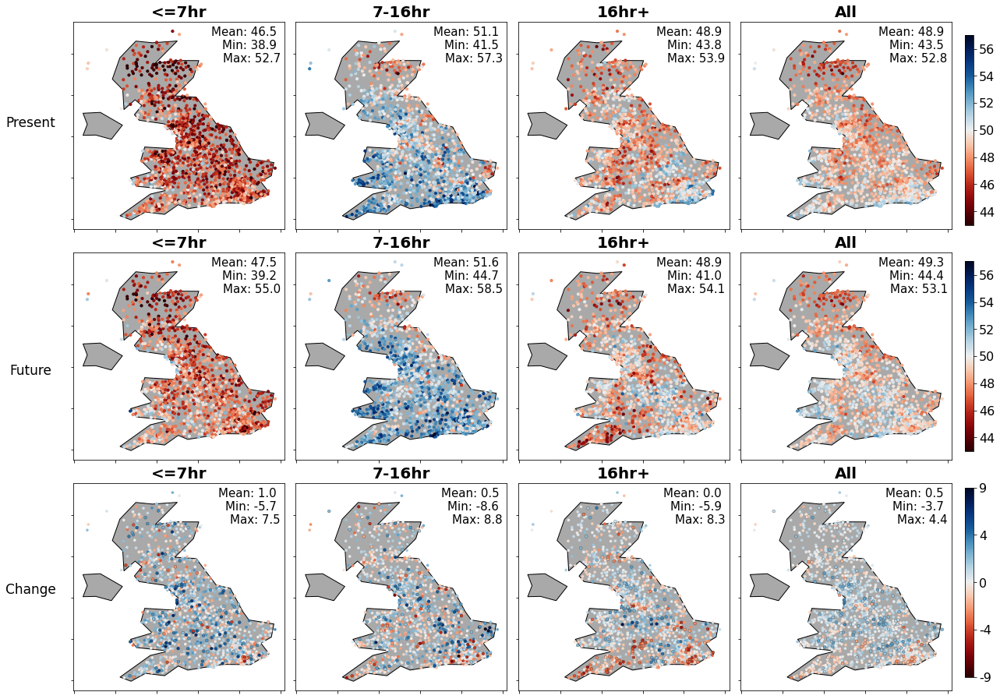

In [26]:
make_plot_durcats(df_changes_all, df_changes_bydurationcat, 'D50_mean', diff_cmap, diff_cmap, D50_diffs_dict, True, -9, 9, 43, 57) 

/nfs/a319/gy17m2a/PhD/Scripts/FindIndependentRainfallEvents/AnalyseProfiles/AMAX_Events/MasterPlot_Functions.py:1204: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


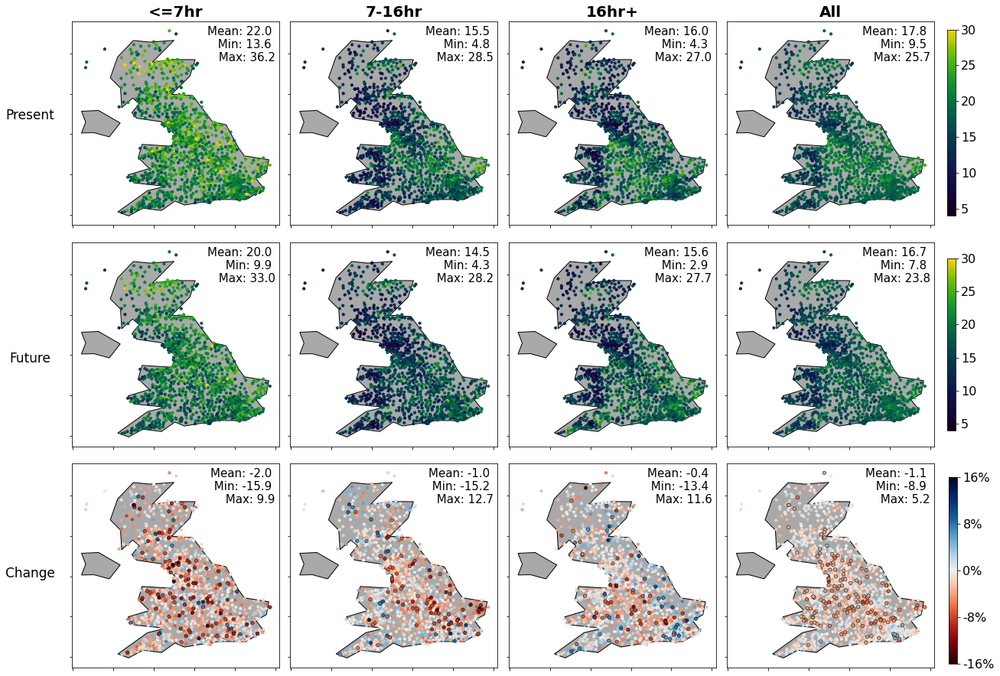

In [27]:
make_plot_durcats_quintiles(df_changes_all, df_changes_bydurationcat, 'F2_percentage', quintiles_cmap, diff_cmap, results_dict, 1, 4, 30) 

/nfs/a319/gy17m2a/PhD/Scripts/FindIndependentRainfallEvents/AnalyseProfiles/AMAX_Events/MasterPlot_Functions.py:1204: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


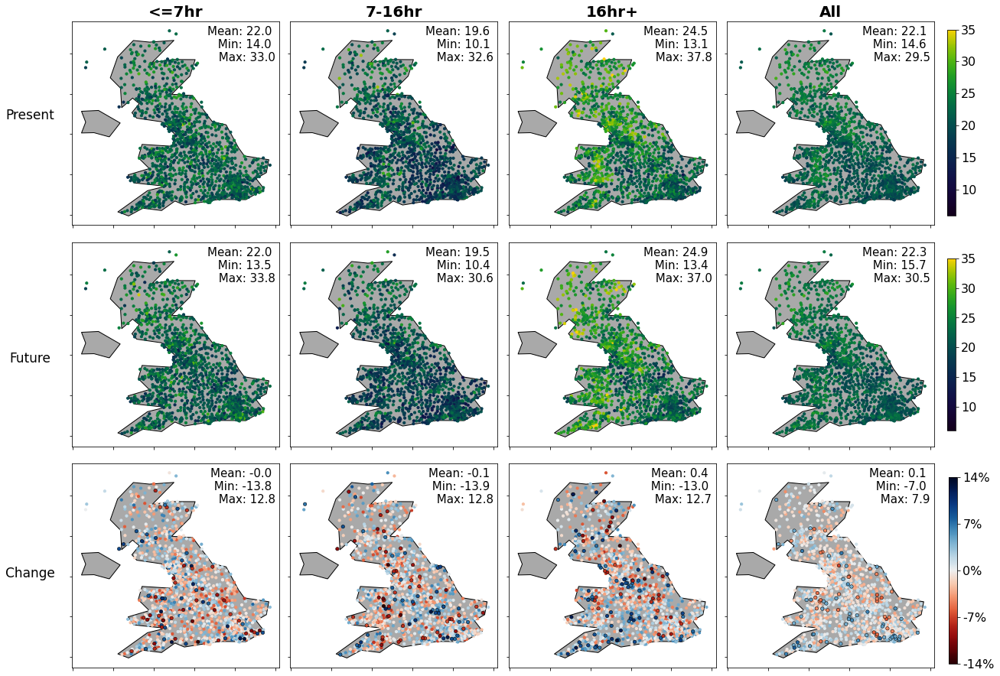

In [28]:
make_plot_durcats_quintiles(df_changes_all, df_changes_bydurationcat, 'F1_percentage', quintiles_cmap, diff_cmap, results_dict, 2, 6, 35) 

/nfs/a319/gy17m2a/PhD/Scripts/FindIndependentRainfallEvents/AnalyseProfiles/AMAX_Events/MasterPlot_Functions.py:1204: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


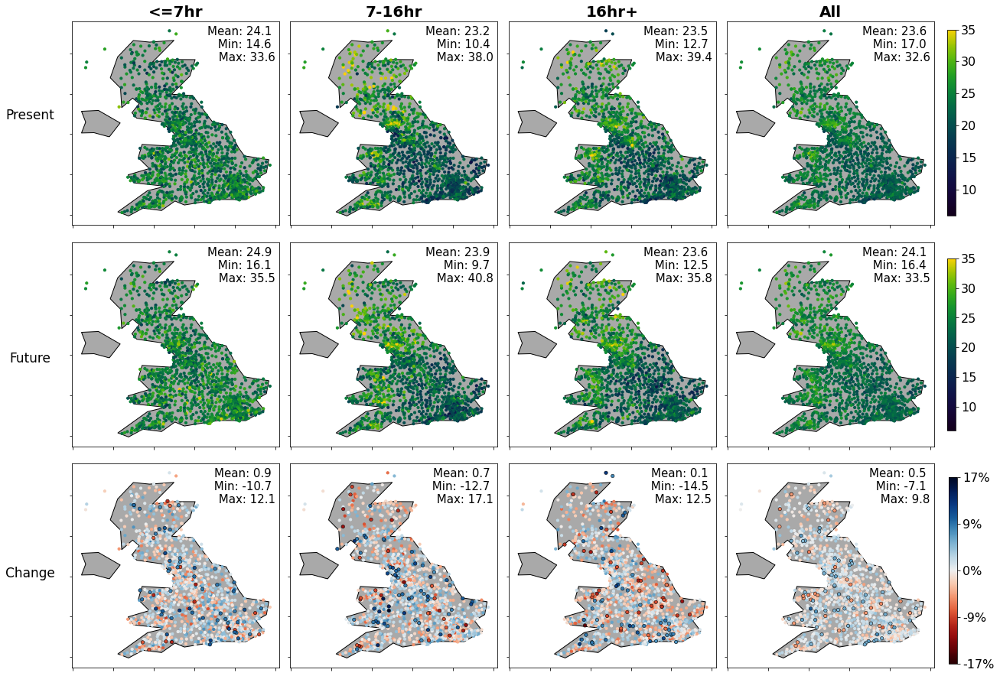

In [29]:
make_plot_durcats_quintiles(df_changes_all, df_changes_bydurationcat, 'C_percentage', quintiles_cmap, diff_cmap, results_dict, 3, 6, 35) 

/nfs/a319/gy17m2a/PhD/Scripts/FindIndependentRainfallEvents/AnalyseProfiles/AMAX_Events/MasterPlot_Functions.py:1204: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


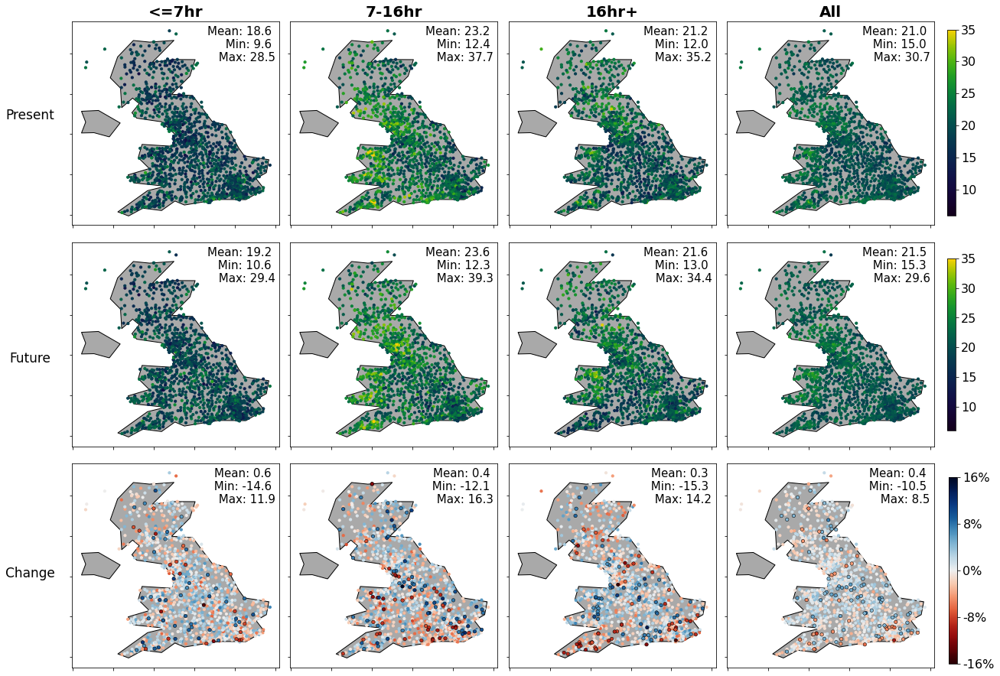

In [30]:
make_plot_durcats_quintiles(df_changes_all, df_changes_bydurationcat, 'B1_percentage', quintiles_cmap, diff_cmap, results_dict, 4, 6, 35) 

/nfs/a319/gy17m2a/PhD/Scripts/FindIndependentRainfallEvents/AnalyseProfiles/AMAX_Events/MasterPlot_Functions.py:1204: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


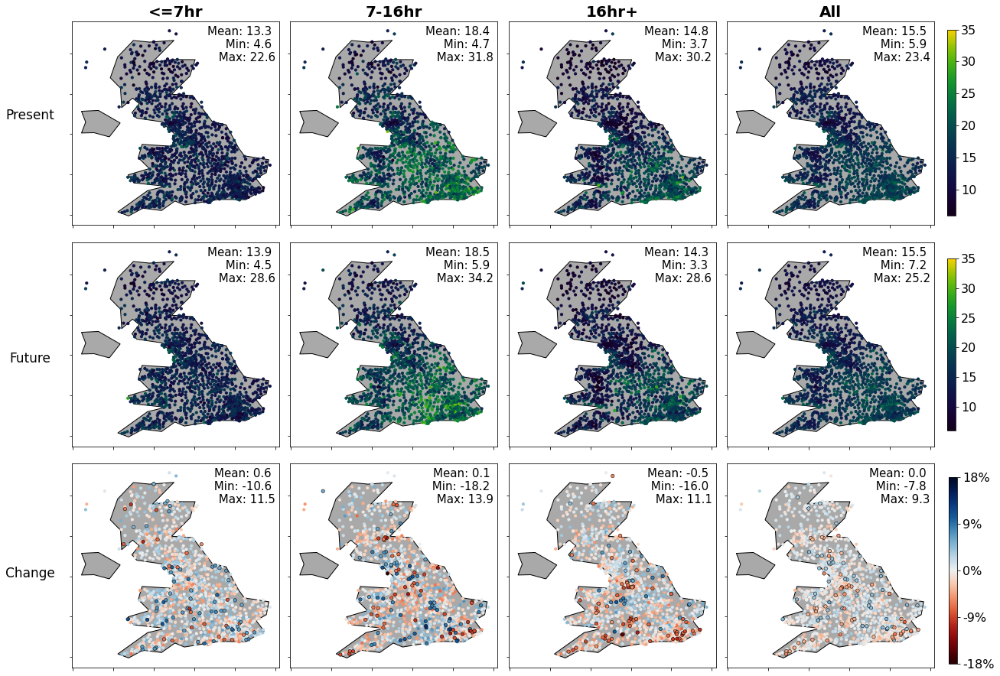

In [31]:
make_plot_durcats_quintiles(df_changes_all, df_changes_bydurationcat, 'B2_percentage', quintiles_cmap, diff_cmap, results_dict, 5, 6, 35) 

## Day of year contour map

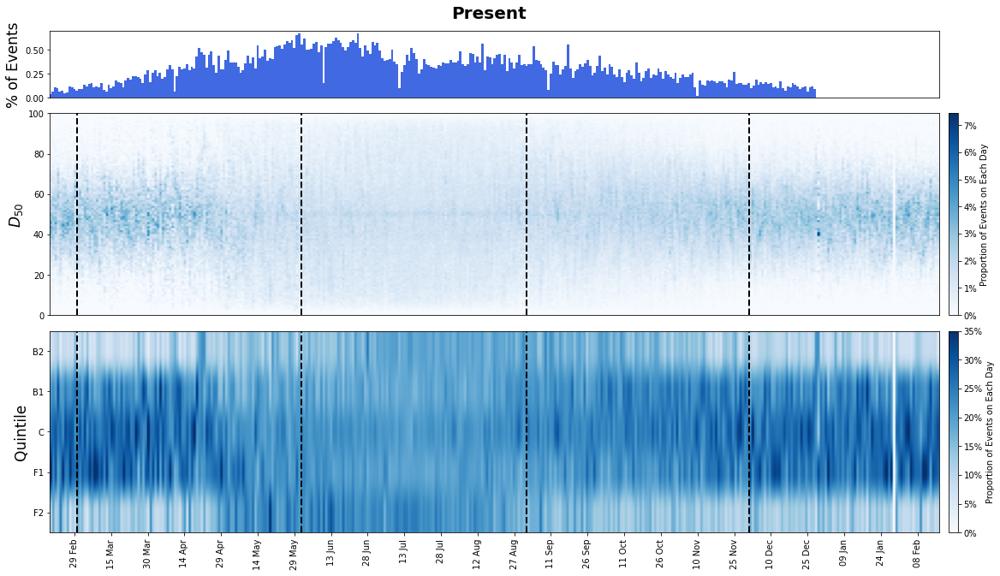

In [32]:
# Set bins to align with the y-axis discrete values
y_bins = range(0,101)
x_bins = 365  # You can keep this as a default for x-axis

# Format colorbar labels as percentages
def to_percent(x, pos):
    return f"{x * 100:.0f}%"  # Convert proportion to percentage with 1 decimal place

fig = plt.figure(figsize=(19, 10))
fig.suptitle("Present", fontsize=20, fontweight='bold')

# Define GridSpec with narrower colorbar column
gs = GridSpec(3, 2, width_ratios=[19, 0.2], height_ratios=[1, 3, 3], figure=fig)
fig.subplots_adjust(top=0.94, wspace=0.02, hspace=0.1)  # Adjust spacing

df = present_all_events

###################### Top subplot: Bar chart showing proportion of events
axs0 = fig.add_subplot(gs[0, 0], sharex=None)  # Doesn't share x-axis ticks

# Get counts for each day
vals, counts = np.unique(df['D'], return_counts=True)
counts_df = pd.DataFrame({'Day': vals, 'counts': counts})

# Calculate the total number of events
total_events = counts_df['counts'].sum()

# Convert counts to proportions
counts_df['proportion'] = counts_df['counts'] / total_events

# Plot the proportions
axs0.bar(np.arange(0, len(counts_df['proportion'])), counts_df['proportion']*100, color='royalblue', linewidth=2, width=1)

# Set labels and title
axs0.set_ylabel('% of Events', fontsize=17)
# axs0.set_title('Proportion of Events per Day', fontsize=20)

###################### Middle subplot: 2D histogram (D50) sharing x-axis
axs1 = fig.add_subplot(gs[1, 0], sharex=axs0)  # Share x-axis with axs0
y_bins = range(0,101)
hist, x_edges_d50, y_edges_d50 = np.histogram2d(df['D'], df['D50_new'], bins=[x_bins, y_bins])

# Normalize the histogram for each day (x-axis)
hist_normalized_present_d50 = np.zeros_like(hist)
for i in range(hist.shape[0]):
    day_total = hist[i, :].sum()
    if day_total > 0:
        hist_normalized_present_d50[i, :] = hist[i, :] / day_total

img1 = axs1.imshow(hist_normalized_present_d50.T, origin='lower', cmap='Blues', 
                   extent=[x_edges_d50[0], x_edges_d50[-1], y_edges_d50[0], y_edges_d50[-1]],
                   aspect='auto')
axs1.set_ylabel(r"$D_{50}$", fontsize=17)

# Add a colorbar for proportions
cax1 = fig.add_subplot(gs[1, 1])  # Second column for the colorbar
cbar1 = fig.colorbar(img1, cax=cax1, orientation='vertical')
cbar1.set_label('Proportion of Events on Each Day')
cbar1.formatter = FuncFormatter(to_percent)  # Format as percentages
cbar1.update_ticks()  # Update the ticks after applying the formatter

###############################
# Middle subplot: 2D histogram (D50) sharing x-axis

from matplotlib import colors
norm = colors.Normalize(vmin=0, vmax=0.35)

axs2 = fig.add_subplot(gs[2, 0], sharex=axs0)  # Share x-axis with axs0
y_bins = [0.5, 1.5, 2.5, 3.5, 4.5, 5.5]
hist, x_edges, y_edges = np.histogram2d(df['D'], df['max_quintile_molly'], bins=[x_bins, y_bins])

# Normalize the histogram for each day (x-axis)
hist_normalized_present_quintile = np.zeros_like(hist)
for i in range(hist.shape[0]):
    day_total = hist[i, :].sum()
    if day_total > 0:
        hist_normalized_present_quintile[i, :] = hist[i, :] / day_total

img2 = axs2.imshow(hist_normalized_present_quintile.T, origin='lower', cmap='Blues',norm=norm,
                   extent=[x_edges[0], x_edges_d50[-1], y_edges[0], y_edges[-1]],
                   aspect='auto')
axs2.set_ylabel("Quintile", fontsize=17)

# Add a colorbar for proportions
cax2 = fig.add_subplot(gs[2, 1])  # Second column for the colorbar
cbar2 = fig.colorbar(img2, cax=cax2, orientation='vertical')
cbar2.set_label('Proportion of Events on Each Day')
cbar2.formatter = FuncFormatter(to_percent)  # Format as percentages
cbar2.update_ticks()  # Update the ticks after applying the formatter

# Define specific dates
march_1 = date_to_julian_day("2000-03-01")
june_1 = date_to_julian_day("2000-06-01")
sept_1 = date_to_julian_day("2000-09-01")
dec_1 = date_to_julian_day("2000-12-01")
# Add vertical lines to axs1 and axs2
for ax in [axs1, axs2]:
    ax.axvline(x=march_1, color='black', linestyle='--', linewidth=2, label="1st March")
    ax.axvline(x=june_1, color='black', linestyle='--', linewidth=2, label="1st June")
    ax.axvline(x=sept_1, color='black', linestyle='--', linewidth=2, label="1st September")
    ax.axvline(x=dec_1, color='black', linestyle='--', linewidth=2, label="1st December")

# Suppress x-ticks on all but the bottom axis
axs0.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
axs1.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

# Format x-axis for axs2 (shared with axs0 and axs1)
x_min, x_max = axs0.get_xlim()
axs0.xaxis.set_major_locator(MaxNLocator(integer=True, prune='lower', nbins=25))
ticks = axs0.get_xticks()
visible_ticks = [tick for tick in ticks if x_min <= tick <= x_max]
tick_labels = [julian_to_date(int(tick)) for tick in visible_ticks]
axs2.set_xticks(visible_ticks)  # Apply to bottom axis (affects all shared x-axes)
axs2.xaxis.set_major_formatter(FixedFormatter(tick_labels))
axs2.tick_params(axis='x', rotation=90)


axs2.set_yticks([1, 2, 3, 4, 5])  # Set tick positions
axs2.set_yticklabels(['F2', 'F1', 'C', 'B1', 'B2'])  # Set custom labels

plt.show()

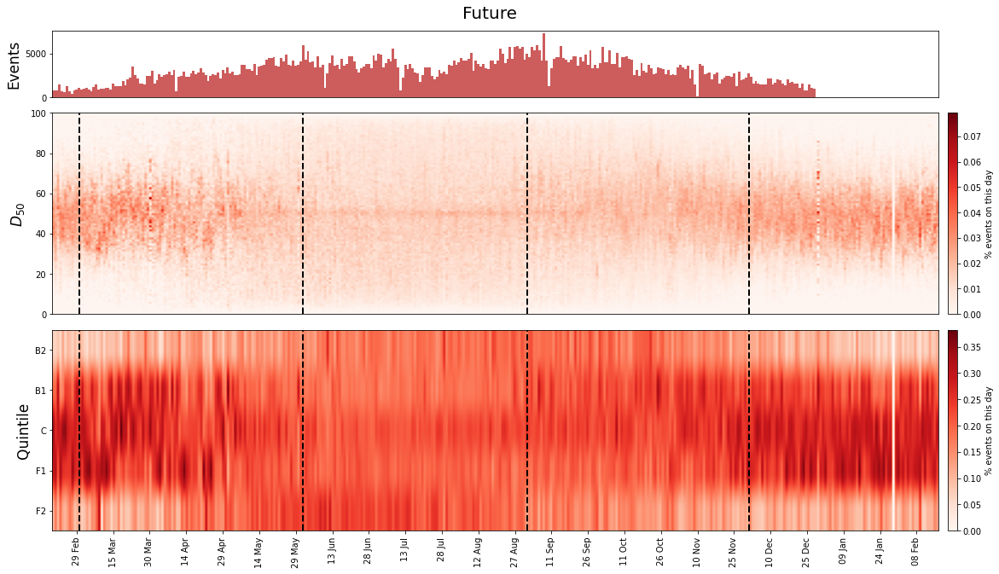

In [33]:
fig = plt.figure(figsize=(19, 10))
fig.suptitle("Future", fontsize=20)

# Define GridSpec with narrower colorbar column
gs = GridSpec(3, 2, width_ratios=[19, 0.2], height_ratios=[1, 3, 3], figure=fig)
fig.subplots_adjust(top=0.94, wspace=0.02, hspace=0.1)  # Adjust spacing

df = future_all_events

# Top subplot: Bar chart
axs0 = fig.add_subplot(gs[0, 0], sharex=None)  # Doesn't share x-axis ticks
vals, counts = np.unique(df['D'], return_counts=True)
counts_df = pd.DataFrame({'Day': vals, 'counts': counts})
axs0.bar(np.arange(0, len(counts_df['counts'])), counts_df['counts'], color='indianred', linewidth=2, width=1)
axs0.set_ylabel('Events', fontsize=17)

# Middle subplot: 2D histogram (D50) sharing x-axis
axs1 = fig.add_subplot(gs[1, 0], sharex=axs0)  # Share x-axis with axs0
y_bins = range(0,101)
hist, x_edges_d50, y_edges_d50 = np.histogram2d(df['D'], df['D50_new'], bins=[x_bins, y_bins])

# Normalize the histogram for each day (x-axis)
hist_normalized_future_d50 = np.zeros_like(hist)
for i in range(hist.shape[0]):
    day_total = hist[i, :].sum()
    if day_total > 0:
        hist_normalized_future_d50[i, :] = hist[i, :] / day_total

img1 = axs1.imshow(hist_normalized_future_d50.T, origin='lower', cmap='Reds',
                   extent=[x_edges_d50[0], x_edges_d50[-1], y_edges_d50[0], y_edges_d50[-1]],
                   aspect='auto')
axs1.set_ylabel(r"$D_{50}$", fontsize=17)

# Add a colorbar for proportions
cax1 = fig.add_subplot(gs[1, 1])  # Second column for the colorbar
cbar1 = fig.colorbar(img1, cax=cax1, orientation='vertical')
cbar1.set_label('% events on this day')

###############################
# Middle subplot: 2D histogram (D50) sharing x-axis
axs2 = fig.add_subplot(gs[2, 0], sharex=axs0)  # Share x-axis with axs0
y_bins = [0.5, 1.5, 2.5, 3.5, 4.5, 5.5]
hist, x_edges_quintiles, y_edges_quintiles = np.histogram2d(df['D'], df['max_quintile_molly'], bins=[x_bins, y_bins])

# Normalize the histogram for each day (x-axis)
hist_normalized_future_quintile = np.zeros_like(hist)
for i in range(hist.shape[0]):
    day_total = hist[i, :].sum()
    if day_total > 0:
        hist_normalized_future_quintile[i, :] = hist[i, :] / day_total

img2 = axs2.imshow(hist_normalized_future_quintile.T, origin='lower', cmap='Reds',
                   extent=[x_edges_quintiles[0], x_edges_quintiles[-1], y_edges_quintiles[0], y_edges_quintiles[-1]],
                   aspect='auto')
axs2.set_ylabel("Quintile", fontsize=17)

# Add a colorbar for proportions
cax2 = fig.add_subplot(gs[2, 1])  # Second column for the colorbar
cbar2 = fig.colorbar(img2, cax=cax2, orientation='vertical')
cbar2.set_label('% events on this day')

# Add vertical lines to axs1 and axs2
for ax in [axs1, axs2]:
    ax.axvline(x=march_1, color='black', linestyle='--', linewidth=2, label="1st March")
    ax.axvline(x=june_1, color='black', linestyle='--', linewidth=2, label="1st June")
    ax.axvline(x=sept_1, color='black', linestyle='--', linewidth=2, label="1st September")
    ax.axvline(x=dec_1, color='black', linestyle='--', linewidth=2, label="1st December")

# Suppress x-ticks on all but the bottom axis
axs0.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
axs1.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

# Format x-axis for axs2 (shared with axs0 and axs1)
x_min, x_max = axs0.get_xlim()
axs0.xaxis.set_major_locator(MaxNLocator(integer=True, prune='lower', nbins=25))
ticks = axs0.get_xticks()
visible_ticks = [tick for tick in ticks if x_min <= tick <= x_max]
tick_labels = [julian_to_date(int(tick)) for tick in visible_ticks]
axs2.set_xticks(visible_ticks)  # Apply to bottom axis (affects all shared x-axes)
axs2.xaxis.set_major_formatter(FixedFormatter(tick_labels))
axs2.tick_params(axis='x', rotation=90)

axs2.set_yticks([1, 2, 3, 4, 5])  # Set tick positions
axs2.set_yticklabels(['F2', 'F1', 'C', 'B1', 'B2'])  # Set custom labels
plt.show()


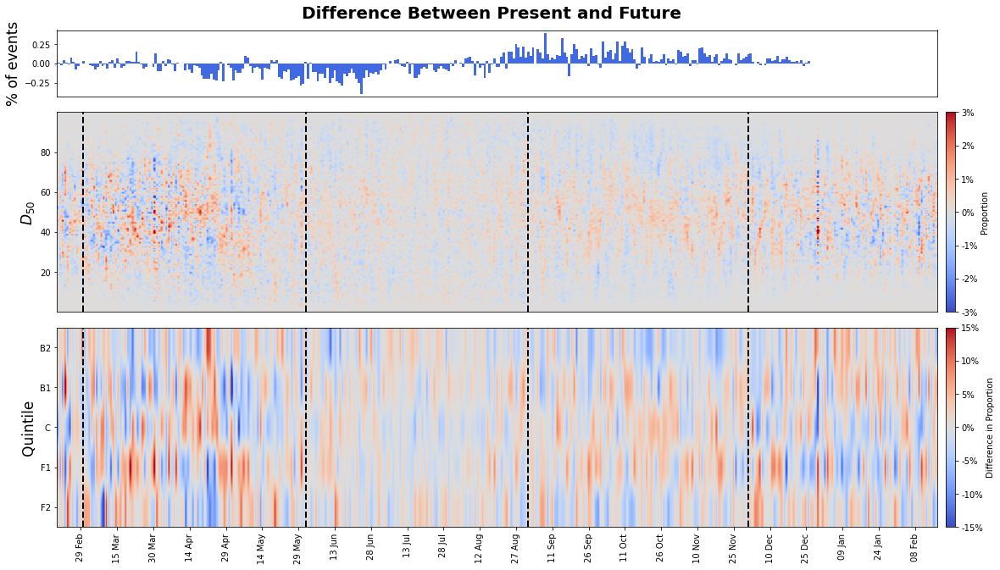

In [35]:
# Format colorbar labels as percentages
def to_percent(x, pos):
    return f"{x * 100:.0f}%"  # Convert proportion to percentage with 1 decimal place

fig = plt.figure(figsize=(19, 10))
fig.suptitle("Difference Between Present and Future", fontsize=20, fontweight='bold')

# Define GridSpec with narrower colorbar column
gs = GridSpec(3, 2, width_ratios=[19, 0.2], height_ratios=[1, 3, 3], figure=fig)
fig.subplots_adjust(top=0.94, wspace=0.02, hspace=0.1)  # Adjust spacing

# ###################### Top subplot: Bar chart showing difference in proportions
axs0 = fig.add_subplot(gs[0, 0], sharex=None)  # Doesn't share x-axis ticks

# Get counts for each day in both present and future
vals_present, counts_present = np.unique(present_all_events['D'], return_counts=True)
counts_df_present = pd.DataFrame({'Day': vals_present, 'counts': counts_present})

vals_future, counts_future = np.unique(future_all_events['D'], return_counts=True)
counts_df_future = pd.DataFrame({'Day': vals_future, 'counts': counts_future})

# Calculate the total number of events for both present and future
total_events_present = counts_df_present['counts'].sum()
total_events_future = counts_df_future['counts'].sum()

# Convert counts to proportions
counts_df_present['proportion'] = counts_df_present['counts'] / total_events_present
counts_df_future['proportion'] = counts_df_future['counts'] / total_events_future

# Ensure both datasets have the same days (fill missing days with zeros)
merged_df = pd.merge(counts_df_present[['Day', 'proportion']], counts_df_future[['Day', 'proportion']], on='Day', how='outer', suffixes=('_present', '_future'))
merged_df = merged_df.fillna(0)  # Fill missing values with 0

# Calculate the difference in proportions
merged_df['proportion_diff'] = merged_df['proportion_future'] - merged_df['proportion_present']

diff_hist_quintile = hist_normalized_present_quintile - hist_normalized_future_quintile
diff_hist_d50 = hist_normalized_present_d50 - hist_normalized_future_d50

# Plot the difference in proportions
axs0.bar(np.arange(0, len(merged_df['proportion_diff'])), merged_df['proportion_diff']*100, color='royalblue', linewidth=2, width=1)
axs0.set_ylabel('% of events', fontsize=17)

# ###################### Middle subplot: 2D histogram (D50) showing the difference
axs1 = fig.add_subplot(gs[1, 0], sharex=axs0)  # Share x-axis with axs0
img1 = axs1.imshow(diff_hist_d50.T, origin='lower', cmap='coolwarm',  # Use a diverging colormap (coolwarm)
                   extent=[x_edges_d50[0], x_edges_d50[-1], y_edges_d50[0], y_edges_d50[-1]], aspect='auto', vmin=-0.03, vmax=0.03)

# Set the y-axis ticks at 20, 40, 60, and 80
y_ticks = [20, 40, 60, 80]
axs1.set_yticks(y_ticks)

# Optionally, set y-tick labels to match the desired positions
# If you want the ticks to show the category labels (e.g., 20, 40, 60, 80), leave it as it is.
axs1.set_yticklabels([str(tick) for tick in y_ticks])

# Label for y-axis
axs1.set_ylabel(r"$D_{50}$", fontsize=17)

# Colorbar
cax1 = fig.add_subplot(gs[1, 1])  # Second column for the colorbar
cbar1 = fig.colorbar(img1, cax=cax1, orientation='vertical')
cbar1.set_label('Proportion')
cbar1.formatter = FuncFormatter(to_percent)  # Format as percentages
cbar1.update_ticks()  # Update the ticks after applying the formatter


############################## Middle subplot: 2D histogram (Quintile) showing the difference
axs2 = fig.add_subplot(gs[2, 0], sharex=axs0)  # Share x-axis with axs0

# Plot the normalized difference
img2 = axs2.imshow(diff_hist_quintile.T, origin='lower', cmap='coolwarm',  # Use a diverging colormap (coolwarm)
                   extent=[x_edges_quintiles[0], x_edges_quintiles[-1], y_edges_quintiles[0], y_edges_quintiles[-1]], 
                   aspect='auto', vmin=-0.15, vmax=0.15)
axs2.set_ylabel("Quintile", fontsize=17)

# Add a colorbar for the difference
cax2 = fig.add_subplot(gs[2, 1])  # Second column for the colorbar
cbar2 = fig.colorbar(img2, cax=cax2, orientation='vertical')
cbar2.set_label('Difference in Proportion')
cbar2.formatter = FuncFormatter(to_percent)  # Format as percentages
cbar2.update_ticks()  # Update the ticks after applying the formatter

# Add vertical lines to axs1 and axs2
for ax in [axs1, axs2]:
    ax.axvline(x=march_1, color='black', linestyle='--', linewidth=2, label="1st March")
    ax.axvline(x=june_1, color='black', linestyle='--', linewidth=2, label="1st June")
    ax.axvline(x=sept_1, color='black', linestyle='--', linewidth=2, label="1st September")
    ax.axvline(x=dec_1, color='black', linestyle='--', linewidth=2, label="1st December")

# Suppress x-ticks on all but the bottom axis
axs0.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
axs1.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

# Format x-axis for axs2 (shared with axs0 and axs1)
x_min, x_max = axs0.get_xlim()
axs0.xaxis.set_major_locator(MaxNLocator(integer=True, prune='lower', nbins=25))
ticks = axs0.get_xticks()
visible_ticks = [tick for tick in ticks if x_min <= tick <= x_max]
tick_labels = [julian_to_date(int(tick)) for tick in visible_ticks]
axs2.set_xticks(visible_ticks)  # Apply to bottom axis (affects all shared x-axes)
axs2.xaxis.set_major_formatter(FixedFormatter(tick_labels))
axs2.tick_params(axis='x', rotation=90)

# # Set y-ticks for axs2
axs2.set_yticks([1, 2, 3, 4, 5])  # Set tick positions
axs2.set_yticklabels(['F2', 'F1', 'C', 'B1', 'B2'])  # Set custom labels

plt.show()